## IMPORTING LIBRARIES

In [1]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.ensemble import RandomForestClassifier,StackingClassifier
from sklearn.svm import SVC
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, precision_score, recall_score, f1_score
from xgboost import XGBClassifier
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.model_selection import GridSearchCV
import geopandas as gpd
import folium
from folium import GeoJsonTooltip
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

## BUILDING THE MODEL

In [4]:
# lOAD DATA
data = pd.read_csv(r"F:\MS GIS\td.csv")  

# Preview the dataset 
print(data.head())
print("Available columns:", data.columns)

# SELECT FEATURES
features = ['dnbr', 'dndvi', 'Slope', 'Wind', 'NLCD'] 
target = 'Damage_Code'  # Target field with values: 1 means Damage, 2 means No Damage

# Encode the Target Field 
label_encoder = LabelEncoder()
data['Damage_encoded'] = label_encoder.fit_transform(data[target])

# Define X and y 
X = data[features]
y = data['Damage_encoded']

# Split the Dataset (80% training and 20% testing) 
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=42)

# Standardize the Feature Variables 
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Convert y_test back to original labels for evaluation
y_test_labels = label_encoder.inverse_transform(y_test)

# RANDOM FOREST MODEL
rf_model = RandomForestClassifier(random_state=42)
rf_model.fit(X_train_scaled, y_train)
rf_predictions = rf_model.predict(X_test_scaled)
rf_predictions_labels = label_encoder.inverse_transform(rf_predictions)

print("\n--- Random Forest Classification Report ---")
print(classification_report(y_test_labels, rf_predictions_labels))
print("Accuracy:", accuracy_score(y_test_labels, rf_predictions_labels))

# SUPPORT VECTOR MACHINE (SVM)
svm_model = SVC(kernel='rbf', random_state=42)
svm_model.fit(X_train_scaled, y_train)
svm_predictions = svm_model.predict(X_test_scaled)
svm_predictions_labels = label_encoder.inverse_transform(svm_predictions)

print("\n--- SVM Classification Report ---")
print(classification_report(y_test_labels, svm_predictions_labels))
print("Accuracy:", accuracy_score(y_test_labels, svm_predictions_labels))

# LOGISTIC REGRESSION
logreg_model = LogisticRegression(random_state=42)
logreg_model.fit(X_train_scaled, y_train)
logreg_predictions = logreg_model.predict(X_test_scaled)
logreg_predictions_labels = label_encoder.inverse_transform(logreg_predictions)

print("\n--- Logistic Regression Classification Report ---")
print(classification_report(y_test_labels, logreg_predictions_labels))
print("Accuracy:", accuracy_score(y_test_labels, logreg_predictions_labels))

# XGBOOST
xgb_model = XGBClassifier(random_state=42, eval_metric='mlogloss', use_label_encoder=False)
xgb_model.fit(X_train_scaled, y_train)
xgb_predictions = xgb_model.predict(X_test_scaled)
xgb_predictions_labels = label_encoder.inverse_transform(xgb_predictions)

print("\n--- XGBoost Classification Report ---")
print(classification_report(y_test_labels, xgb_predictions_labels))
print("Accuracy:", accuracy_score(y_test_labels, xgb_predictions_labels))


             DAMAGE                         STRUCTURETYPE  dnbr  dndvi  \
0  Destroyed (>50%)   Single Family Residence Multi Story  0.07   0.00   
1  Destroyed (>50%)   Single Family Residence Multi Story  0.09   0.05   
2  Destroyed (>50%)    Multi Family Residence Multi Story -0.04  -0.08   
3  Destroyed (>50%)  Single Family Residence Single Story  0.06  -0.07   
4  Destroyed (>50%)  Single Family Residence Single Story  0.03  -0.04   

       Slope  Wind  NLCD   Longitude   Latitude  Damage_Code  
0   3.710000  3.07     1 -118.659630  34.039128            1  
1   8.220000  3.07     1 -118.659490  34.039090            1  
2  19.379999  3.14     3 -118.657609  34.039405            1  
3   5.860000  3.14     3 -118.656632  34.038810            1  
4   4.660000  3.14     3 -118.656064  34.038732            1  
Available columns: Index(['DAMAGE', 'STRUCTURETYPE', 'dnbr', 'dndvi', 'Slope', 'Wind', 'NLCD',
       'Longitude', 'Latitude', 'Damage_Code'],
      dtype='object')

--- Random 

C:\Users\siddh\AppData\Roaming\Python\Python311\site-packages\xgboost\training.py:183: UserWarning: [15:12:02] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


The analysis involved four classification models—Random Forest, SVM, Logistic Regression, and XGBoost—applied to a dataset of 1909 test samples, where the majority class (class 1, “Damage”) comprises 1501 samples and the minority class (class 2, “No Damage”) comprises 408 samples.

Random Forest:

Achieved an overall accuracy of approximately 80.8%.

For class 1, the model recorded a precision of 0.85 and a recall of 0.92, reflecting strong performance in identifying damaged instances.

However, performance on class 2 was lower, with a precision of 0.57 and recall of 0.40, indicating some difficulty in accurately identifying undamaged cases.

The confusion matrix revealed 1379 true positives for class 1 and 164 true positives for class 2, with misclassifications evident in both directions.

SVM:

Reported a slightly higher overall accuracy of about 81.7%.

The model showed excellent recall (0.96) for class 1 with a precision of 0.83.

Conversely, for class 2, the performance dropped with a precision of 0.65 and a notably low recall of 0.30, suggesting that many undamaged cases were missed.

The confusion matrix supported these findings, showing a higher number of false negatives for class 2.

Logistic Regression:

Delivered an overall accuracy of roughly 79.5%, the lowest among the four models.

It achieved a precision of 0.82 and recall of 0.94 for class 1, indicating good detection of damaged structures.

For class 2, however, the model’s performance was considerably weaker, with a precision of 0.54 and a recall of 0.25, highlighting significant challenges in classifying the minority category.

XGBoost:

Attained an overall accuracy of around 81.2%, closely matching the SVM’s performance.

For class 1, precision and recall were 0.85 and 0.92, respectively, which is on par with the other models.

For class 2, the model showed modest improvements with a precision of 0.58 and recall of 0.43, suggesting a slightly better balance in identifying the minority class compared to the other algorithms.

Summary:
All models demonstrated robust performance in classifying the majority “Damage” class; however, each faced challenges with the minority “No Damage” class. The SVM and XGBoost models achieved slightly higher overall accuracies, but SVM’s lower recall for class 2 suggests a trade-off in sensitivity. Logistic Regression, while performing adequately for class 1, underperformed significantly for class 2. These results indicate a need for further refinement—potentially through techniques like class weighting, resampling, or model tuning—to enhance detection of the less-represented class.

## Simplified Target Variable and Stratified Train-Test Split:

In [3]:
# Labeling data
damage_map = {1: 'Damage', 2: 'No Damage'}
data['Damage_Simplified'] = data['Damage_Code'].map(damage_map)

# Encode the Target Field  
label_encoder = LabelEncoder() 
data['Damage_encoded'] = label_encoder.fit_transform(data['Damage_Simplified']) 
# label_encoder.classes_ should be: ['Damage', 'No Damage']

# Define x and y
features = ['dnbr', 'dndvi', 'Slope', 'Wind', 'NLCD']
target = 'Damage_encoded'
X = data[features]
y = data[target]

# Train-Test Split with Stratification 
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42, stratify=y
)

# Standardize the Features 
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Convert y_test back to original (simplified) labels for evaluation 
y_test_labels = label_encoder.inverse_transform(y_test)

# RANDOM FOREST MODEL 
rf_model = RandomForestClassifier(random_state=42)
rf_model.fit(X_train_scaled, y_train)
rf_predictions = rf_model.predict(X_test_scaled)
rf_predictions_labels = label_encoder.inverse_transform(rf_predictions)

print("\n--- Random Forest Classification Report ---")
print(classification_report(y_test_labels, rf_predictions_labels))
print("Accuracy:", accuracy_score(y_test_labels, rf_predictions_labels))

# SUPPORT VECTOR MACHINE (SVM) 
svm_model = SVC(kernel='rbf', random_state=42)
svm_model.fit(X_train_scaled, y_train)
svm_predictions = svm_model.predict(X_test_scaled)
svm_predictions_labels = label_encoder.inverse_transform(svm_predictions)

print("\n--- SVM Classification Report ---")
print(classification_report(y_test_labels, svm_predictions_labels))
print("Accuracy:", accuracy_score(y_test_labels, svm_predictions_labels))

# LOGISTIC REGRESSION 
logreg_model = LogisticRegression(random_state=42)
logreg_model.fit(X_train_scaled, y_train)
logreg_predictions = logreg_model.predict(X_test_scaled)
logreg_predictions_labels = label_encoder.inverse_transform(logreg_predictions)

print("\n--- Logistic Regression Classification Report ---")
print(classification_report(y_test_labels, logreg_predictions_labels))
print("Accuracy:", accuracy_score(y_test_labels, logreg_predictions_labels))

# XGBOOST MODEL 
xgb_model = XGBClassifier(random_state=42, eval_metric='mlogloss', )
xgb_model.fit(X_train_scaled, y_train)
xgb_predictions = xgb_model.predict(X_test_scaled)
xgb_predictions_labels = label_encoder.inverse_transform(xgb_predictions)


print("\n--- XGBoost Classification Report ---")
print(classification_report(y_test_labels, xgb_predictions_labels))
print("Accuracy:", accuracy_score(y_test_labels, xgb_predictions_labels))



--- Random Forest Classification Report ---
              precision    recall  f1-score   support

      Damage       0.86      0.93      0.89      1506
   No Damage       0.63      0.44      0.52       403

    accuracy                           0.83      1909
   macro avg       0.75      0.69      0.71      1909
weighted avg       0.81      0.83      0.82      1909

Accuracy: 0.8271346254583551

--- SVM Classification Report ---
              precision    recall  f1-score   support

      Damage       0.84      0.96      0.90      1506
   No Damage       0.71      0.33      0.45       403

    accuracy                           0.83      1909
   macro avg       0.78      0.64      0.67      1909
weighted avg       0.81      0.83      0.80      1909

Accuracy: 0.8297537977998952

--- Logistic Regression Classification Report ---
              precision    recall  f1-score   support

      Damage       0.82      0.95      0.88      1506
   No Damage       0.58      0.24      0.34     

Stratified Train-Test Split:

Using the stratify=y parameter in the train-test split ensures that both the training and testing sets maintain the same class distribution as the original dataset. This is particularly beneficial for imbalanced datasets, as it prevents the model from being biased toward the majority class and improves overall evaluation performance.

These modifications help the models train on more consistent and representative data, resulting in better performance metrics in the second code scenario.

XGBoost is the best model when compared to other models whereas it shows good results for Random Forest model too

Model	            Accuracy	Damage F1	No Damage F1	                   Comments
Random Forest	     82.7%	       0.89	        0.52	      Good at detecting Damage, weaker at No Damage
SVM	                 82.9%	       0.90	        0.45	      Strong at Damage, poor recall for No Damage
Logistic Regression	 80.3%	       0.88	        0.34	       Worse overall, esp. at detecting No Damage
XGBoost	             83.2%	       0.90	        0.53	            Best balance of performance

## COMPARISION OF RESULTS

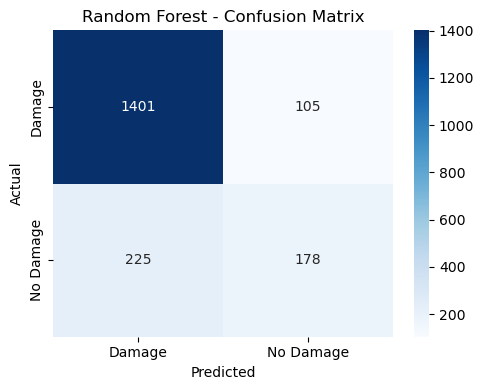

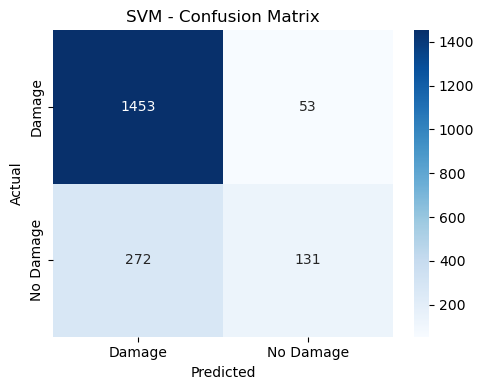

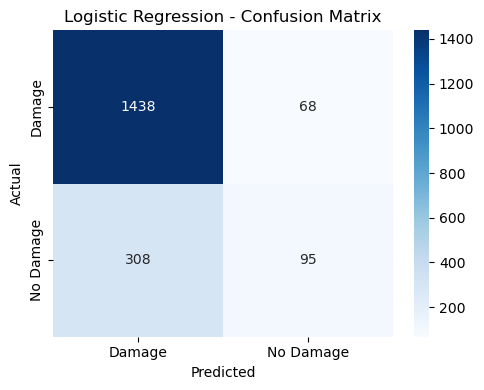

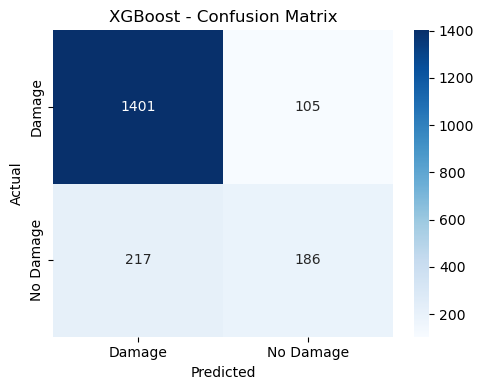

In [4]:
def plot_confusion_heatmap(y_true, y_pred, model_name):
    cm = confusion_matrix(y_true, y_pred, labels=label_encoder.classes_)
    plt.figure(figsize=(5,4))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', 
                xticklabels=label_encoder.classes_, 
                yticklabels=label_encoder.classes_)
    plt.title(f'{model_name} - Confusion Matrix')
    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    plt.tight_layout()
    plt.show()

plot_confusion_heatmap(y_test_labels, rf_predictions_labels, "Random Forest")
plot_confusion_heatmap(y_test_labels, svm_predictions_labels, "SVM")
plot_confusion_heatmap(y_test_labels, logreg_predictions_labels, "Logistic Regression")
plot_confusion_heatmap(y_test_labels, xgb_predictions_labels, "XGBoost")


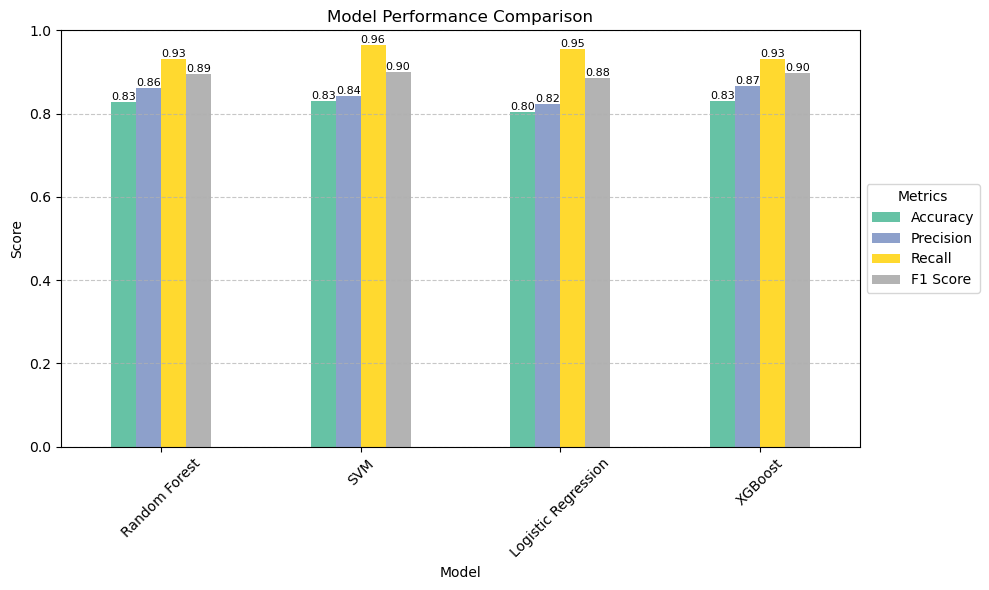

In [5]:
# Updated model comparison plot with external legend
# Define again in case you're in a fresh cell
model_names = ['Random Forest', 'SVM', 'Logistic Regression', 'XGBoost']
accuracies = [
    accuracy_score(y_test_labels, rf_predictions_labels),
    accuracy_score(y_test_labels, svm_predictions_labels),
    accuracy_score(y_test_labels, logreg_predictions_labels),
    accuracy_score(y_test_labels, xgb_predictions_labels)
]
precisions = [
    precision_score(y_test_labels, rf_predictions_labels, pos_label='Damage'),
    precision_score(y_test_labels, svm_predictions_labels, pos_label='Damage'),
    precision_score(y_test_labels, logreg_predictions_labels, pos_label='Damage'),
    precision_score(y_test_labels, xgb_predictions_labels, pos_label='Damage')
]
recalls = [
    recall_score(y_test_labels, rf_predictions_labels, pos_label='Damage'),
    recall_score(y_test_labels, svm_predictions_labels, pos_label='Damage'),
    recall_score(y_test_labels, logreg_predictions_labels, pos_label='Damage'),
    recall_score(y_test_labels, xgb_predictions_labels, pos_label='Damage')
]
f1s = [
    f1_score(y_test_labels, rf_predictions_labels, pos_label='Damage'),
    f1_score(y_test_labels, svm_predictions_labels, pos_label='Damage'),
    f1_score(y_test_labels, logreg_predictions_labels, pos_label='Damage'),
    f1_score(y_test_labels, xgb_predictions_labels, pos_label='Damage')
]
  
score_df = pd.DataFrame({
    "Model": model_names,
    "Accuracy": accuracies,
    "Precision": precisions,
    "Recall": recalls,
    "F1 Score": f1s
}).set_index("Model")
score_df.plot(kind='bar', figsize=(10, 6), colormap='Set2')
plt.title('Model Performance Comparison')
plt.ylabel('Score')
plt.ylim(0.0, 1.0)
plt.xticks(rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Move legend outside
plt.legend(loc='center left', bbox_to_anchor=(1.0, 0.5), title="Metrics", frameon=True)

# Add value labels
for container in plt.gca().containers:
    plt.bar_label(container, fmt='%.2f', label_type='edge', fontsize=8)

plt.tight_layout()
plt.show()


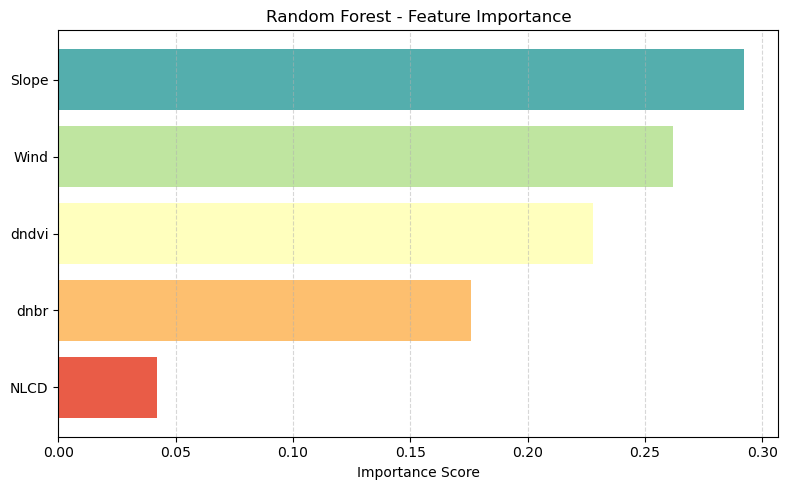

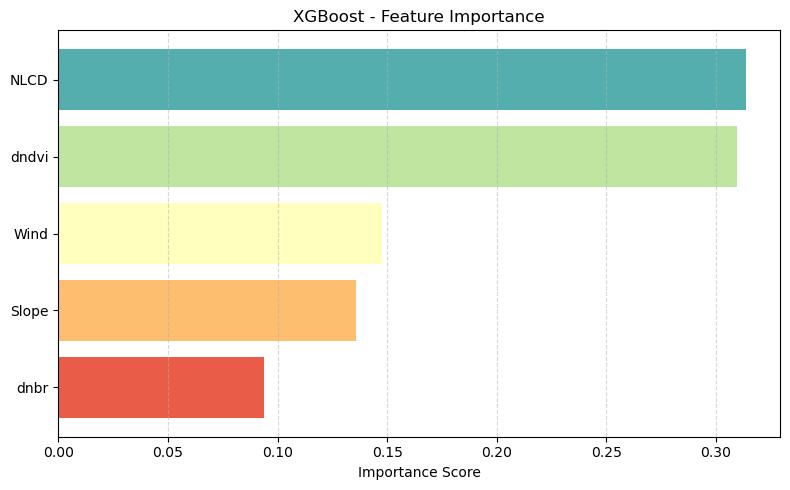

In [6]:
features = ['dnbr', 'dndvi', 'Slope', 'Wind', 'NLCD']
def plot_feature_importance_clean(importances, model_name):
    sorted_idx = np.argsort(importances)
    sorted_features = np.array(features)[sorted_idx]
    sorted_importances = importances[sorted_idx]

    # Create a color map manually
    colors = sns.color_palette("Spectral", len(sorted_importances))

    plt.figure(figsize=(8, 5))
    bars = plt.barh(sorted_features, sorted_importances, color=colors)
    plt.title(f"{model_name} - Feature Importance")
    plt.xlabel("Importance Score")
    plt.grid(axis='x', linestyle='--', alpha=0.5)
    plt.tight_layout()
    plt.show()

# Usage
plot_feature_importance_clean(rf_model.feature_importances_, "Random Forest")
plot_feature_importance_clean(xgb_model.feature_importances_, "XGBoost")


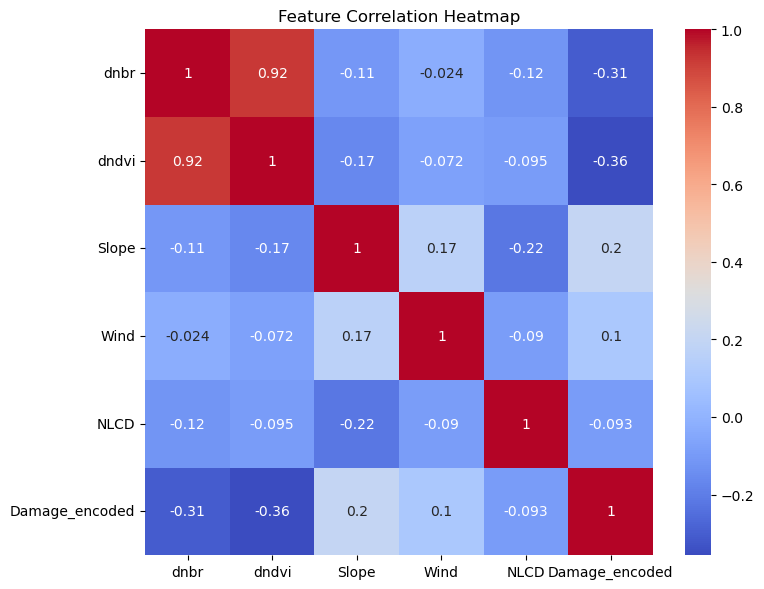

In [7]:
plt.figure(figsize=(8,6))
sns.heatmap(data[features + ['Damage_encoded']].corr(), annot=True, cmap='coolwarm')
plt.title("Feature Correlation Heatmap")
plt.tight_layout()
plt.show()


## VISUALIZING THE TESTING DATASET ON FOLIUM MAP

In [8]:
# Get test indices from original DataFrame
_, test_indices = train_test_split(
    data.index, test_size=0.2, random_state=42, stratify=data['Damage_Simplified']
)

# Mark test/train in original data
data['Dataset_Type'] = 'Train'
data.loc[test_indices, 'Dataset_Type'] = 'Test'

# Add predicted labels back to the test data
data.loc[test_indices, 'Predicted_Label'] = xgb_predictions_labels

# Convert to GeoDataFrame
data['geometry'] = gpd.points_from_xy(data['Longitude'], data['Latitude'])
gdf_all = gpd.GeoDataFrame(data, geometry='geometry', crs="EPSG:4326")

# Filter only Test data
gdf_test = gdf_all[gdf_all['Dataset_Type'] == 'Test']

# Get test indices from original DataFrame
_, test_indices = train_test_split(
    data.index, test_size=0.2, stratify=data['Damage_Simplified'], random_state=42
)

data['Dataset_Type'] = 'Train'
data.loc[test_indices, 'Dataset_Type'] = 'Test'
data.loc[test_indices, 'Predicted_Label'] = xgb_predictions_labels

# Step 8: Convert to GeoDataFrame
data['geometry'] = gpd.points_from_xy(data['Longitude'], data['Latitude'])
gdf_all = gpd.GeoDataFrame(data, geometry='geometry', crs="EPSG:4326")
gdf_test = gdf_all[gdf_all['Dataset_Type'] == 'Test']

# Step 9: Load Building Footprints
buildings = gpd.read_file(r"F:\MS GIS\cal_BP.shp")
buildings = buildings.to_crs("EPSG:4326")

# Step 10: Spatial Join with only test data
buildings_joined = gpd.sjoin(
    buildings,
    gdf_test[['geometry', 'Damage_Simplified', 'Predicted_Label', 'Dataset_Type']],
    how='left',
    predicate='contains'
)

buildings_joined = buildings_joined.drop_duplicates(subset='geometry')
buildings_joined['Predicted_Label'] = buildings_joined['Predicted_Label'].fillna('No Prediction')
buildings_joined['Damage_Simplified'] = buildings_joined['Damage_Simplified'].fillna('No Label')
buildings_joined['Dataset_Type'] = buildings_joined['Dataset_Type'].fillna('Unknown')

# Step 11: Create Interactive Map
center_lat = gdf_test['Latitude'].mean()
center_lon = gdf_test['Longitude'].mean()
m = folium.Map(location=[center_lat, center_lon], zoom_start=13, tiles='OpenStreetMap')

# Add GeoJson layer
folium.GeoJson(
    buildings_joined,
    name='Buildings with Predictions (Test Set)',
    tooltip=GeoJsonTooltip(
        fields=['Damage_Simplified', 'Predicted_Label', 'Dataset_Type'],
        aliases=['Ground Truth:', 'Predicted:', 'Dataset:'],
        localize=True
    ),
    style_function=lambda feature: {
        'fillColor': (
            'red' if feature['properties']['Predicted_Label'] == 'Damage'
            else 'green' if feature['properties']['Predicted_Label'] == 'No Damage'
            else 'gray'
        ),
        'color': 'black',
        'weight': 0.3,
        'fillOpacity': 0.5
    }
).add_to(m)

# Add Legend
legend_html = """
<div style="
     position: fixed;
     bottom: 50px;
     left: 50px;
     width: 220px;
     background-color: white;
     z-index:9999;
     font-size:14px;
     border:2px solid grey;
     border-radius:5px;
     padding: 10px;
     box-shadow: 2px 2px 6px rgba(0,0,0,0.3);">

  <b>Prediction Legend</b><br>
  <div style="margin-top:5px;">
    <i style="background:red; width:10px; height:10px;
              float:left; margin-right:6px; display:inline-block;"></i> Damage<br>
    <i style="background:green; width:10px; height:10px;
              float:left; margin-right:6px; display:inline-block;"></i> No Damage<br>
    <i style="background:gray; width:10px; height:10px;
              float:left; margin-right:6px; display:inline-block;"></i> No Prediction
  </div>

  <div style="margin-top:10px; clear:both;">
    <b>Tooltip shows:</b><br>
    Ground Truth,<br>
    Prediction,<br>
    Dataset Type
  </div>
</div>
"""

m.get_root().html.add_child(folium.Element(legend_html))
m

## PREDICTION FOR ALL THE VALUES USING XGB

In [9]:
# Scale the Full Dataset 
X_all_scaled = scaler.transform(X)  

# Predict on All Samples 
full_predictions = xgb_model .predict(X_all_scaled)

full_predictions_labels = label_encoder.inverse_transform(full_predictions)

# Add to data frame
data['Predicted_Label'] = full_predictions_labels

# Drop rows with missing ground truth or prediction just in case
eval_data = data.dropna(subset=['Damage_Simplified', 'Predicted_Label'])

# Calculate accuracy
accuracy = accuracy_score(eval_data['Damage_Simplified'], eval_data['Predicted_Label'])
print(" Accuracy on all buildings:", round(accuracy * 100, 2), "%")

# Confusion matrix
print("\n Confusion Matrix:")
print(confusion_matrix(eval_data['Damage_Simplified'], eval_data['Predicted_Label'], labels=['Damage', 'No Damage']))

# Classification report
print("\n Classification Report:")
print(classification_report(eval_data['Damage_Simplified'], eval_data['Predicted_Label'], target_names=['Damage', 'No Damage']))



 Accuracy on all buildings: 90.42 %

 Confusion Matrix:
[[7317  212]
 [ 702 1312]]

 Classification Report:
              precision    recall  f1-score   support

      Damage       0.91      0.97      0.94      7529
   No Damage       0.86      0.65      0.74      2014

    accuracy                           0.90      9543
   macro avg       0.89      0.81      0.84      9543
weighted avg       0.90      0.90      0.90      9543



## VISUALIZATION

In [10]:
# Split your data to get train/test indices
X_temp, X_test_indices = train_test_split(
    data.index, test_size=0.2, stratify=data['Damage_Simplified'], random_state=42
)

# Assign dataset type
data['Dataset_Type'] = 'Train'
data.loc[X_test_indices, 'Dataset_Type'] = 'Test'

# Convert to GeoDataFrame 
data['geometry'] = gpd.points_from_xy(data['Longitude'], data['Latitude'])
gdf_all = gpd.GeoDataFrame(data, geometry='geometry', crs="EPSG:4326")

# Load Building Footprints 
buildings = gpd.read_file(r"F:\MS GIS\cal_BP.shp")
buildings = buildings.to_crs("EPSG:4326")

# Spatial Join 
buildings_joined = gpd.sjoin(
    buildings,
    gdf_all[['geometry', 'Damage_Simplified', 'Predicted_Label', 'Dataset_Type']],
    how='left',
    predicate='contains'
)
# Remove duplicate buildings based on geometry to prevent visual overlap
buildings_joined = buildings_joined.drop_duplicates(subset='geometry')

# Fill missing values
buildings_joined['Predicted_Label'] = buildings_joined['Predicted_Label'].fillna('No Prediction')
buildings_joined['Damage_Simplified'] = buildings_joined['Damage_Simplified'].fillna('No Label')
buildings_joined['Dataset_Type'] = buildings_joined['Dataset_Type'].fillna('Unknown')

# Create Interactive Map 
center_lat = data['Latitude'].mean()
center_lon = data['Longitude'].mean()
m = folium.Map(location=[center_lat, center_lon], zoom_start=13, tiles='OpenStreetMap')

# Add GeoJson with tooltip showing all 3 fields
folium.GeoJson(
    buildings_joined,
    name='Buildings with Predictions',
    tooltip=GeoJsonTooltip(
        fields=['Damage_Simplified', 'Predicted_Label', 'Dataset_Type'],
        aliases=['Ground Truth:', 'Predicted:', 'Dataset:'],
        localize=True
    ),
    style_function=lambda feature: {
        'fillColor': (
            'red' if feature['properties']['Predicted_Label'] == 'Damage'
            else 'green' if feature['properties']['Predicted_Label'] == 'No Damage'
            else 'gray'
        ),
        'color': 'black',
        'weight': 0.3,
        'fillOpacity': 0.5
    }
).add_to(m)

# Add Custom Legend 
legend_html = """
<div style="
     position: fixed;
     bottom: 50px;
     left: 50px;
     width: 220px;
     background-color: white;
     z-index:9999;
     font-size:14px;
     border:2px solid grey;
     border-radius:5px;
     padding: 10px;
     box-shadow: 2px 2px 6px rgba(0,0,0,0.3);">

  <b>Prediction Legend</b><br>
  <div style="margin-top:5px;">
    <i style="background:red; width:10px; height:10px;
              float:left; margin-right:6px; display:inline-block;"></i> Damage<br>
    <i style="background:green; width:10px; height:10px;
              float:left; margin-right:6px; display:inline-block;"></i> No Damage<br>
    <i style="background:gray; width:10px; height:10px;
              float:left; margin-right:6px; display:inline-block;"></i> No Prediction
  </div>

  <div style="margin-top:10px; clear:both;">
    <b>Tooltip shows:</b><br>
    Ground Truth,<br>
    Prediction,<br>
    Dataset Type
  </div>
</div>
"""

m.get_root().html.add_child(folium.Element(legend_html))

# Save Map 
m.save("F:/MS GIS/XGBoost_Predicted_Map_with_Legend_and_DatasetType.html")
m